## Data Preprocessing

In [111]:
# !pip install geopandas
# !pip install shapely

In [112]:
# Standard library
import numpy as np
import pandas as pd
import math
import time
import glob

# Geospatial library
import geopandas as gpd
from shapely.geometry import Point
from shapely.geometry.polygon import Polygon

# Visualisation library
import plotly.express as px
import plotly.graph_objects as go

import warnings
warnings.filterwarnings("ignore")

In [113]:
# Load file
mainfile = "../datasets/fire_nrt_J1V-C2_342404.csv"
raw_df = pd.read_csv(mainfile)
adm_df = gpd.read_file("https://raw.githubusercontent.com/datawithalvin/geojson-indonesia/main/IndonesianCitiesDistrictsUpdated.json")

# Display
display(raw_df.head(3), raw_df.shape,
        adm_df.head(3), adm_df.shape)

,latitude,longitude,brightness,scan,track,acq_date,acq_time,satellite,instrument,confidence,version,bright_t31,frp,daynight
0,-2.86912,140.87904,341.1,0.48,0.40,2020-01-01,412,1,VIIRS,n,2.0NRT,295.2,19.2,D
1,-8.56291,140.91167,330.6,0.42,0.38,2020-01-01,412,1,VIIRS,l,2.0NRT,300.7,5.4,D
2,-0.54323,115.54757,329.6,0.51,0.41,2020-01-01,554,1,VIIRS,n,2.0NRT,280.5,4.4,D


(229153, 14)

,id,provinsi,geometry
0,Aceh Barat,Aceh,"POLYGON ((96.49109 4.62277, 96.49329 4.56110, ..."
1,Aceh Barat Daya,Aceh,"POLYGON ((97.15358 3.74559, 97.14205 3.73411, ..."
2,Aceh Besar,Aceh,"MULTIPOLYGON (((95.17371 5.55513, 95.15416 5.5..."


(517, 3)

In [114]:
print(adm_df["geometry"][0])

POLYGON ((96.49108650000005 4.622769400000038, 96.49328820000005 4.561099400000046, 96.49021750000009 4.552493800000036, 96.46306900000008 4.545449500000075, 96.45873670000003 4.532816500000024, 96.44043560000006 4.510043000000053, 96.45258690000009 4.489769600000045, 96.47959070000007 4.460954300000026, 96.45330540000003 4.433266700000047, 96.43336360000006 4.423129200000062, 96.38349780000004 4.420133900000053, 96.37195940000004 4.417353800000058, 96.37164920000004 4.392784800000072, 96.35803000000004 4.381830400000069, 96.34099470000007 4.379381800000033, 96.31967810000003 4.364701400000058, 96.29599330000008 4.368311100000028, 96.29688690000006 4.35053750000003, 96.28595350000006 4.289271000000042, 96.28608390000005 4.2696421000000555, 96.28065440000006 4.253807300000062, 96.26855360000008 4.239303500000062, 96.26820880000008 4.217312400000026, 96.27687380000003 4.210487400000034, 96.27239030000004 4.196622200000036, 96.27665670000005 4.184918100000061, 96.27491980000008 4.16593600

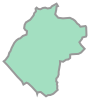

In [115]:
adm_df["geometry"][0]

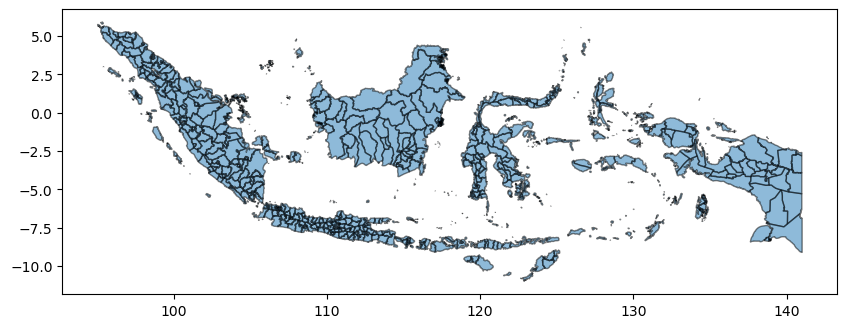

In [116]:
ax = adm_df.plot(figsize=(10, 10), alpha=0.5, edgecolor='k')

In [117]:
display(raw_df["confidence"].unique())

array(['n', 'l', 'h'], dtype=object)

In [118]:
# Set column to index
raw_df["acq_date"] = pd.to_datetime(raw_df["acq_date"])
raw_df = raw_df.set_index("acq_date")

raw_df = raw_df.sort_index()

raw_df.head(3)

,latitude,longitude,brightness,scan,track,acq_time,satellite,instrument,confidence,version,bright_t31,frp,daynight
acq_date,,,,,,,,,,,,,
2020-01-01,-2.86912,140.87904,341.1,0.48,0.40,412,1,VIIRS,n,2.0NRT,295.2,19.2,D
2020-01-01,-8.56291,140.91167,330.6,0.42,0.38,412,1,VIIRS,l,2.0NRT,300.7,5.4,D
2020-01-01,-0.54323,115.54757,329.6,0.51,0.41,554,1,VIIRS,n,2.0NRT,280.5,4.4,D


In [119]:
raw_df.head(10)

,latitude,longitude,brightness,scan,track,acq_time,satellite,instrument,confidence,version,bright_t31,frp,daynight
acq_date,,,,,,,,,,,,,
2020-01-01,-2.86912,140.87904,341.1,0.48,0.40,412,1,VIIRS,n,2.0NRT,295.2,19.2,D
2020-01-01,-8.56291,140.91167,330.6,0.42,0.38,412,1,VIIRS,l,2.0NRT,300.7,5.4,D
2020-01-01,-0.54323,115.54757,329.6,0.51,0.41,554,1,VIIRS,n,2.0NRT,280.5,4.4,D
2020-01-01,1.63081,101.30399,337.9,0.41,0.61,600,1,VIIRS,n,2.0NRT,286.6,3.6,D
2020-01-01,1.63637,101.30315,332.8,0.41,0.61,600,1,VIIRS,n,2.0NRT,288.8,2.9,D
2020-01-01,1.76760,99.23405,329.3,0.57,0.69,600,1,VIIRS,n,2.0NRT,284.2,3.9,D
2020-01-01,-1.45604,127.43602,335.5,0.40,0.37,1654,1,VIIRS,n,2.0NRT,291.3,5.9,N
2020-01-01,-1.16473,131.33495,324.9,0.40,0.44,1654,1,VIIRS,n,2.0NRT,289.3,2.5,N
2020-01-01,1.50601,127.63271,301.1,0.39,0.36,1654,1,VIIRS,n,2.0NRT,278.8,0.4,N


In [120]:
# Upsample to daily frequency and count the number of fires in each mont
monthly_fires = raw_df.resample('M')['frp'].count()
monthly_fires = pd.DataFrame(monthly_fires).reset_index()
monthly_fires

,acq_date,frp
0,2020-01-31,3613
1,2020-02-29,3915
2,2020-03-31,4918
3,2020-04-30,3861
4,2020-05-31,2147
5,2020-06-30,3169
6,2020-07-31,5778
7,2020-08-31,20911
8,2020-09-30,19396
9,2020-10-31,14490


In [121]:
# Select columns
viirs_df = raw_df[["latitude", "longitude", "acq_time", 
                   "confidence", "frp", "daynight", "brightness"]]

# Rename values
viirs_df["confidence"] = viirs_df["confidence"].replace({
    "n":"nominal", "h":"high", "l":"low"
})

viirs_df["daynight"] = viirs_df["daynight"].replace({
    "D":"day", "N":"night"
})

viirs_df.head(3)

,latitude,longitude,acq_time,confidence,frp,daynight,brightness
acq_date,,,,,,,
2020-01-01,-2.86912,140.87904,412,nominal,19.2,day,341.1
2020-01-01,-8.56291,140.91167,412,low,5.4,day,330.6
2020-01-01,-0.54323,115.54757,554,nominal,4.4,day,329.6


In [122]:
# Set points dataframe
viirs_df["coords"] = list(zip(viirs_df["longitude"], viirs_df["latitude"]))
viirs_df["coords"] = viirs_df["coords"].apply(Point)

points = gpd.GeoDataFrame(viirs_df, geometry="coords")

In [123]:
display(type(viirs_df), viirs_df.head(2), type(points), points.head(2))

pandas.core.frame.DataFrame

,latitude,longitude,acq_time,confidence,frp,daynight,brightness,coords
acq_date,,,,,,,,
2020-01-01,-2.86912,140.87904,412,nominal,19.2,day,341.1,POINT (140.87904 -2.86912)
2020-01-01,-8.56291,140.91167,412,low,5.4,day,330.6,POINT (140.91167 -8.56291)


geopandas.geodataframe.GeoDataFrame

,latitude,longitude,acq_time,confidence,frp,daynight,brightness,coords
acq_date,,,,,,,,
2020-01-01,-2.86912,140.87904,412,nominal,19.2,day,341.1,POINT (140.87904 -2.86912)
2020-01-01,-8.56291,140.91167,412,low,5.4,day,330.6,POINT (140.91167 -8.56291)


In [124]:
# Perform spatial join to match points and polygons
start = time.time()

joined_df = gpd.tools.sjoin(points, adm_df, predicate="within", how='left')

end = time.time()
display(("time:", end-start), joined_df.head(2))

('time:', 0.4150230884552002)

,latitude,longitude,acq_time,confidence,frp,daynight,brightness,coords,index_right,id,provinsi
acq_date,,,,,,,,,,,
2020-01-01,-2.86912,140.87904,412,nominal,19.2,day,341.1,POINT (140.87904 -2.86912),147.0,Keerom,Papua
2020-01-01,-8.56291,140.91167,412,low,5.4,day,330.6,POINT (140.91167 -8.56291),339.0,Merauke,Papua


In [125]:
joined_df = joined_df.rename(columns={
    "id":"regency_city", "provinsi":"province"
})

joined_df = joined_df.drop(["acq_time", "coords", "brightness", "index_right"], axis=1)

# extract the year and month from the datetime index and create new columns
joined_df = joined_df.assign(year=joined_df.index.year, month=joined_df.index.strftime('%B'))

joined_df.head(3)

,latitude,longitude,confidence,frp,daynight,regency_city,province,year,month
acq_date,,,,,,,,,
2020-01-01,-2.86912,140.87904,nominal,19.2,day,Keerom,Papua,2020,January
2020-01-01,-8.56291,140.91167,low,5.4,day,Merauke,Papua,2020,January
2020-01-01,-0.54323,115.54757,nominal,4.4,day,Kutai Barat,Kalimantan Timur,2020,January


In [126]:
joined_df.tail(15)

,latitude,longitude,confidence,frp,daynight,regency_city,province,year,month
acq_date,,,,,,,,,
2023-04-07,-8.11171,112.92358,nominal,6.57,night,Malang,Jawa Timur,2023,April
2023-04-07,-8.11564,112.92683,nominal,2.35,night,Lumajang,Jawa Timur,2023,April
2023-04-07,-8.11227,112.92716,nominal,2.35,night,Lumajang,Jawa Timur,2023,April
2023-04-07,-7.24230,109.21506,nominal,1.20,night,Pemalang,Jawa Tengah,2023,April
2023-04-07,-7.48306,112.35644,nominal,0.95,night,Jombang,Jawa Timur,2023,April
2023-04-07,-6.03210,105.95534,nominal,1.94,night,Kota Cilegon,Banten,2023,April
2023-04-07,-6.41935,106.44258,nominal,1.08,night,Lebak,Banten,2023,April
2023-04-07,-6.41994,106.44139,nominal,1.09,night,Lebak,Banten,2023,April
2023-04-07,-5.99402,105.99570,nominal,0.85,night,Kota Cilegon,Banten,2023,April


In [127]:
joined_df.to_csv("../datasets/preprocessed-data.csv", index=True)

## 2. Buat Komponen Dashboard

<img src="../figures/wireframe-viirs.jpg" alt="Alt Text" style="width:50%;">

In [128]:
fires_2022 = joined_df[joined_df["year"]==2022].reset_index(drop=False)
fires_2022.head()

,acq_date,latitude,longitude,confidence,frp,daynight,regency_city,province,year,month
0,2022-01-01,-8.25284,140.32532,nominal,2.39,day,Merauke,Papua,2022,January
1,2022-01-01,-6.43064,139.58951,nominal,3.25,day,Mappi,Papua,2022,January
2,2022-01-01,-4.47982,136.79703,nominal,4.77,day,Mimika,Papua,2022,January
3,2022-01-01,-4.01855,136.09239,nominal,4.85,day,Dogiyai,Papua,2022,January
4,2022-01-01,-3.99912,136.09816,nominal,3.72,day,Dogiyai,Papua,2022,January


In [129]:
def create_density_map(dataframe):
    # Define hover data
    hover_data = {
        'acq_date': True, 'frp': True, 'province': True,
        'longitude': False, 'latitude': False
    }
    
    # Create density map figure
    fig = px.density_mapbox(
        dataframe, lat='latitude', lon='longitude',
        z='frp', radius=2, center=dict(lat=-2.5, lon=118),
        zoom=3.8, hover_name='regency_city',
        hover_data=hover_data, color_continuous_scale='matter_r',
        mapbox_style='carto-darkmatter', template='plotly_dark'
    )
    
    # Update figure layout
    fig.update_layout(
        width=1000, height=475,
        margin=dict(r=1, t=1, l=1, b=1), plot_bgcolor='rgba(0, 0, 0, 0)', paper_bgcolor='rgba(0, 0, 0, 0)'
    )
    
    # Update colorbar location and orientation
    fig.update_coloraxes(
        showscale=True,
        colorbar=dict(
            len=0.3, yanchor='bottom', y=0,
            xanchor='center',
            thickness=10, title='Fire Radiative Power',
            orientation='h', title_side="top")
    )
    
    return fig

In [130]:
map_2022 = create_density_map(fires_2022)
map_2022

In [131]:
def create_top10_city(dataframe):
    grouped = dataframe.groupby(["regency_city"]).agg(
        total_fires = ("frp", "count")
        )

    grouped = grouped.sort_values(by="total_fires", ascending=False).reset_index()
    grouped = grouped.head(10)

    fig = px.bar(grouped, x="total_fires", y="regency_city", orientation="h", text="total_fires",
                    labels={"regency_city":"", "total_fires":"Jumlah Titik Api"}, template="plotly_dark")
    fig.update_layout(yaxis={'categoryorder':'total ascending'})

    fig.update_layout(autosize=True,width=500,height=475)
    fig.update_layout(title="10 Kabupaten/Kota Dengan Titik Api Terbanyak",title_font_size=14)
    # fig.update_layout(margin={"r":1,"t":1,"l":1,"b":1})
    # fig.update_yaxes(tickfont_size=8)
    fig.update_traces(marker_color='indianred')
    fig.update_layout({'plot_bgcolor': 'rgba(0, 0, 0, 0)','paper_bgcolor': 'rgba(0, 0, 0, 0)',})
    fig.update_xaxes(title_font=dict(size=12))
    fig.update_layout(xaxis_showgrid=False, yaxis_showgrid=False)


    return fig

In [132]:
bar_2022 = create_top10_city(fires_2022)
bar_2022

In [133]:
def create_top10_province(dataframe):
    grouped = dataframe.groupby(["province"]).agg(
        total_fires = ("frp", "count")
        )

    grouped = grouped.sort_values(by="total_fires", ascending=False).reset_index()
    grouped = grouped.head(10)

    fig = px.bar(grouped, x="total_fires", y="province", orientation="h", text="total_fires",
                    labels={"province":"", "total_fires":"Jumlah Titik Api"}, template="plotly_dark")

    fig.update_layout(yaxis={'categoryorder':'total ascending'})

    fig.update_layout(autosize=True,width=500,height=400)
    fig.update_layout(title="10 Provinsi Dengan Titik Api Terbanyak",title_font_size=14)
    # fig.update_layout(margin={"r":1,"t":1,"l":1,"b":1})
    # fig.update_yaxes(tickfont_size=8)
    fig.update_traces(marker_color='indianred')
    fig.update_layout({'plot_bgcolor': 'rgba(0, 0, 0, 0)','paper_bgcolor': 'rgba(0, 0, 0, 0)',})
    fig.update_xaxes(title_font=dict(size=12))
    fig.update_layout(xaxis_showgrid=False, yaxis_showgrid=False)
    

    return fig

In [134]:
bar_2022_prov = create_top10_province(fires_2022)
bar_2022_prov

In [135]:
def create_line_chart(dff):
    line_df = dff

    # Upsample to daily frequency and count the number of fires in each day
    line_df = line_df.resample('D', on='acq_date')['frp'].count()

    fig = px.line(line_df, x=line_df.index, y=line_df.values,
            labels={"y":"<b>Jumlah Titik Api</b>", "acq_date":""},template="plotly_dark")

    fig.update_layout(autosize=True,width=700,height=400)
#     fig.update_layout(margin={"r":0,"t":1,"l":0,"b":0})
    fig.update_layout(title="Jumlah Titik Api Harian yang Terdeteksi", title_font_size=16)
    fig.update_traces(line_color='indianred')
    fig.update_layout({'plot_bgcolor': 'rgba(0, 0, 0, 0)','paper_bgcolor': 'rgba(0, 0, 0, 0)',})
    fig.update_yaxes(title_font=dict(size=12))
    fig.update_layout(xaxis_showgrid=False, yaxis_showgrid=False)

    return fig

In [136]:
line_2022 = create_line_chart(fires_2022)
line_2022

In [137]:
def create_bar_chart_confidence(dff):
    # groupby confidence
    percentage_df = dff.groupby(["confidence"])["frp"].agg("count")
    percentage_df = percentage_df.reset_index()
    percentage_df = percentage_df.rename(columns={"frp":"counts"})
    percentage_df["percent"] = round((percentage_df["counts"] / percentage_df["counts"].sum()) * 100, 2)

    # sort by confidence level
    percentage_df = percentage_df.sort_values(by=['confidence'])

    # build bar chart graph
    fig = px.bar(percentage_df, x='confidence', y='percent', text='percent',
                    color_discrete_sequence=['indianred'],
                    template="plotly_dark")

    fig.update_layout({'plot_bgcolor': 'rgba(0, 0, 0, 0)','paper_bgcolor': 'rgba(0, 0, 0, 0)',})
    fig.update_layout(autosize=True, width=450, height=400)
    fig.update_layout(title="Proporsi Tingkat Confidence Api", title_font_size=14)
    fig.update_xaxes(title='Tingkat Confidence')
    fig.update_yaxes(title='Persentase')
    fig.update_traces(texttemplate='%{text:.2f}%', textposition='outside', textfont_size=10)

    return fig

In [138]:
bar_2022 = create_bar_chart_confidence(fires_2022)
bar_2022